### Notebook for the label transfer of Healthy-CTRL to rest of cells using `scANVI`

- **Developed by:** Carlos Talavera-López Ph.D
- **Institute of Computational Biology - Computational Health Department - Helmholtz Munich**
- v221112

### Import required modules

In [1]:
import scvi
import anndata
import warnings
import numpy as np
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt

Global seed set to 0
/home/cartalop/mambaforge/envs/scvi-tools/lib/python3.9/site-packages/pytorch_lightning/utilities/warnings.py:53: LightningDeprecationWarning: pytorch_lightning.utilities.warnings.rank_zero_deprecation has been deprecated in v1.6 and will be removed in v1.8. Use the equivalent function from the pytorch_lightning.utilities.rank_zero module instead.
  new_rank_zero_deprecation(
/home/cartalop/mambaforge/envs/scvi-tools/lib/python3.9/site-packages/pytorch_lightning/utilities/warnings.py:58: LightningDeprecationWarning: The `pytorch_lightning.loggers.base.rank_zero_experiment` is deprecated in v1.7 and will be removed in v1.9. Please use `pytorch_lightning.loggers.logger.rank_zero_experiment` instead.
  return new_rank_zero_deprecation(*args, **kwargs)


### Set up working environment

In [2]:
sc.settings.verbosity = 3
sc.logging.print_versions()
sc.settings.set_figure_params(dpi = 180, color_map = 'magma_r', dpi_save = 300, vector_friendly = True, format = 'svg')

-----
anndata     0.8.0
scanpy      1.9.1
-----
PIL                 9.3.0
absl                NA
asttokens           NA
attr                22.1.0
backcall            0.2.0
chex                0.1.5
contextlib2         NA
cycler              0.10.0
cython_runtime      NA
dateutil            2.8.2
debugpy             1.6.3
decorator           5.1.1
deprecate           0.3.2
docrep              0.3.2
entrypoints         0.4
executing           1.2.0
flax                0.6.2
fsspec              2022.11.0
google              NA
h5py                3.7.0
ipykernel           6.17.1
ipywidgets          8.0.2
jax                 0.3.25
jaxlib              0.3.25
jedi                0.18.2
joblib              1.2.0
kiwisolver          1.4.4
llvmlite            0.39.1
matplotlib          3.6.2
ml_collections      NA
mpl_toolkits        NA
msgpack             1.0.4
mudata              0.2.1
multipledispatch    0.6.0
natsort             8.2.0
numba               0.56.4
numpy               1.23.5


In [3]:
warnings.simplefilter(action = 'ignore')
scvi.settings.seed = 1712
%config InlineBackend.print_figure_kwargs = {'facecolor' : "w"}
%config InlineBackend.figure_format = 'retina'

Global seed set to 1712


In [4]:
arches_params = dict(
    use_layer_norm = "both",
    use_batch_norm = "none",
    encode_covariates = True,
    dropout_rate = 0.2,
    n_layers = 2,
)

### Read in Healthy data

In [5]:
healthy_raw = sc.read_h5ad('../data/BrEpit_Healthy_scnym_annotated_ctl221101.h5ad')
healthy_raw

AnnData object with n_obs × n_vars = 32767 × 18482
    obs: 'sex', 'age', 'condition', 'ethnicity', 'PaCO2', 'donor', 'infection', 'disease', 'SMK', 'illumina_stimunr', 'bd_rhapsody', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', 'doublet_scores', 'predicted_doublets', 'sample_group', 'scNym', 'scNym_confidence'
    var: 'mt', 'ribo', 'n_cells_by_counts-V1', 'mean_counts-V1', 'pct_dropout_by_counts-V1', 'total_counts-V1', 'n_cells_by_counts-V2', 'mean_counts-V2', 'pct_dropout_by_counts-V2', 'total_counts-V2', 'n_cells_by_counts-V3', 'mean_counts-V3', 'pct_dropout_by_counts-V3', 'total_counts-V3', 'n_cells_by_counts-V4', 'mean_counts-V4', 'pct_dropout_by_counts-V4', 'total_counts-V4', 'n_cells_by_counts-V5', 'mean_counts-V5', 'pct_dropout_by_counts-V5', 'total_counts-V5', 'n_cells_by_counts-V6', 'mean_counts-V6', 'pct_dr

- Remove annotations with less than 10 cells

In [6]:
healthy_raw.obs['scNym'].value_counts()

Goblet                 12495
Basal                   9328
Ciliated                2915
Hillock                 2444
Basal cycling           2148
Secretory               1828
Club                     850
Deuterosomal             303
Rare epi                 209
Goblet inflammatory      105
Hillock cycling           72
Duct                      46
Transit epi               23
Squamous                   1
Name: scNym, dtype: int64

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

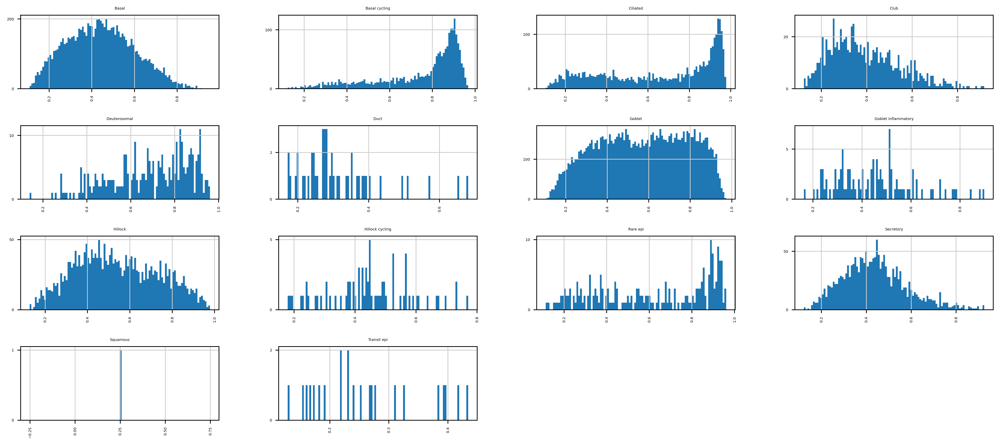

In [7]:
healthy_hist = healthy_raw.obs['scNym_confidence'].hist(by = healthy_raw.obs['scNym'], figsize = (18,8), xlabelsize = 4, ylabelsize = 4, bins = 100)
[x.title.set_size(4) for x in healthy_hist.ravel()]

In [8]:
healthy_raw.obs['scNym'].cat.categories

Index(['Basal', 'Basal cycling', 'Ciliated', 'Club', 'Deuterosomal', 'Duct',
       'Goblet', 'Goblet inflammatory', 'Hillock', 'Hillock cycling',
       'Rare epi', 'Secretory', 'Squamous', 'Transit epi'],
      dtype='object')

In [9]:
healthy_filtered = healthy_raw[~healthy_raw.obs['scNym'].isin(['Duct', 'Squamous', 'Transit epi'])]
healthy_filtered

View of AnnData object with n_obs × n_vars = 32697 × 18482
    obs: 'sex', 'age', 'condition', 'ethnicity', 'PaCO2', 'donor', 'infection', 'disease', 'SMK', 'illumina_stimunr', 'bd_rhapsody', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', 'doublet_scores', 'predicted_doublets', 'sample_group', 'scNym', 'scNym_confidence'
    var: 'mt', 'ribo', 'n_cells_by_counts-V1', 'mean_counts-V1', 'pct_dropout_by_counts-V1', 'total_counts-V1', 'n_cells_by_counts-V2', 'mean_counts-V2', 'pct_dropout_by_counts-V2', 'total_counts-V2', 'n_cells_by_counts-V3', 'mean_counts-V3', 'pct_dropout_by_counts-V3', 'total_counts-V3', 'n_cells_by_counts-V4', 'mean_counts-V4', 'pct_dropout_by_counts-V4', 'total_counts-V4', 'n_cells_by_counts-V5', 'mean_counts-V5', 'pct_dropout_by_counts-V5', 'total_counts-V5', 'n_cells_by_counts-V6', 'mean_counts-V6',

In [10]:
healthy_filtered.obs['seed_labels'] = healthy_filtered.obs['scNym'].copy()

### Read in other unannotated datasets

In [11]:
healthy_iav = sc.read_h5ad('../data/BrEpit_Healthy_IAV_ctl221011.raw.h5ad')
healthy_iav.obs['seed_labels'] = 'Unknown'
healthy_iav

AnnData object with n_obs × n_vars = 31285 × 18482
    obs: 'sex', 'age', 'condition', 'ethnicity', 'PaCO2', 'donor', 'infection', 'disease', 'SMK', 'illumina_stimunr', 'bd_rhapsody', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', 'doublet_scores', 'predicted_doublets', 'sample_group', 'seed_labels'
    var: 'mt', 'ribo', 'n_cells_by_counts-V1', 'mean_counts-V1', 'pct_dropout_by_counts-V1', 'total_counts-V1', 'n_cells_by_counts-V2', 'mean_counts-V2', 'pct_dropout_by_counts-V2', 'total_counts-V2', 'n_cells_by_counts-V3', 'mean_counts-V3', 'pct_dropout_by_counts-V3', 'total_counts-V3', 'n_cells_by_counts-V4', 'mean_counts-V4', 'pct_dropout_by_counts-V4', 'total_counts-V4', 'n_cells_by_counts-V5', 'mean_counts-V5', 'pct_dropout_by_counts-V5', 'total_counts-V5', 'n_cells_by_counts-V6', 'mean_counts-V6', 'pct_dropout_by_count

In [12]:
copd_ctrl = sc.read_h5ad('../data/BrEpit_COPD_CTRL_ctl221011.raw.h5ad')
copd_ctrl.obs['seed_labels'] = 'Unknown'
copd_ctrl

AnnData object with n_obs × n_vars = 34412 × 18482
    obs: 'sex', 'age', 'condition', 'ethnicity', 'PaCO2', 'donor', 'infection', 'disease', 'SMK', 'illumina_stimunr', 'bd_rhapsody', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', 'doublet_scores', 'predicted_doublets', 'sample_group', 'seed_labels'
    var: 'mt', 'ribo', 'n_cells_by_counts-V1', 'mean_counts-V1', 'pct_dropout_by_counts-V1', 'total_counts-V1', 'n_cells_by_counts-V2', 'mean_counts-V2', 'pct_dropout_by_counts-V2', 'total_counts-V2', 'n_cells_by_counts-V3', 'mean_counts-V3', 'pct_dropout_by_counts-V3', 'total_counts-V3', 'n_cells_by_counts-V4', 'mean_counts-V4', 'pct_dropout_by_counts-V4', 'total_counts-V4', 'n_cells_by_counts-V5', 'mean_counts-V5', 'pct_dropout_by_counts-V5', 'total_counts-V5', 'n_cells_by_counts-V6', 'mean_counts-V6', 'pct_dropout_by_count

In [13]:
copd_iav = sc.read_h5ad('../data/BrEpit_COPD_IAV_ctl221011.raw.h5ad')
copd_iav.obs['seed_labels'] = 'Unknown'
copd_iav

AnnData object with n_obs × n_vars = 33003 × 18482
    obs: 'sex', 'age', 'condition', 'ethnicity', 'PaCO2', 'donor', 'infection', 'disease', 'SMK', 'illumina_stimunr', 'bd_rhapsody', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', 'doublet_scores', 'predicted_doublets', 'sample_group', 'seed_labels'
    var: 'mt', 'ribo', 'n_cells_by_counts-V1', 'mean_counts-V1', 'pct_dropout_by_counts-V1', 'total_counts-V1', 'n_cells_by_counts-V2', 'mean_counts-V2', 'pct_dropout_by_counts-V2', 'total_counts-V2', 'n_cells_by_counts-V3', 'mean_counts-V3', 'pct_dropout_by_counts-V3', 'total_counts-V3', 'n_cells_by_counts-V4', 'mean_counts-V4', 'pct_dropout_by_counts-V4', 'total_counts-V4', 'n_cells_by_counts-V5', 'mean_counts-V5', 'pct_dropout_by_counts-V5', 'total_counts-V5', 'n_cells_by_counts-V6', 'mean_counts-V6', 'pct_dropout_by_count

In [14]:
adata = healthy_filtered.concatenate(healthy_iav, copd_ctrl, copd_iav, batch_key = 'group', batch_categories = ['healthy_ctrl', 'healthy_iav', 'copd_ctrl', 'copd_iav'], join = 'inner')
adata

AnnData object with n_obs × n_vars = 131397 × 18482
    obs: 'sex', 'age', 'condition', 'ethnicity', 'PaCO2', 'donor', 'infection', 'disease', 'SMK', 'illumina_stimunr', 'bd_rhapsody', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', 'doublet_scores', 'predicted_doublets', 'sample_group', 'scNym', 'scNym_confidence', 'seed_labels', 'group'
    var: 'mt', 'ribo', 'n_cells_by_counts-V1', 'mean_counts-V1', 'pct_dropout_by_counts-V1', 'total_counts-V1', 'n_cells_by_counts-V2', 'mean_counts-V2', 'pct_dropout_by_counts-V2', 'total_counts-V2', 'n_cells_by_counts-V3', 'mean_counts-V3', 'pct_dropout_by_counts-V3', 'total_counts-V3', 'n_cells_by_counts-V4', 'mean_counts-V4', 'pct_dropout_by_counts-V4', 'total_counts-V4', 'n_cells_by_counts-V5', 'mean_counts-V5', 'pct_dropout_by_counts-V5', 'total_counts-V5', 'n_cells_by_counts-V6', 

### Transfer of annotation with scANVI

In [15]:
scvi.model.SCVI.setup_anndata(adata, batch_key = 'donor', labels_key = "seed_labels")

In [16]:
scvi_model = scvi.model.SCVI(adata, n_latent = 50, n_layers = 3)

In [17]:
scvi_model.train(100)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 100/100: 100%|██████████| 100/100 [13:53<00:00,  8.33s/it, loss=1.42e+04, v_num=1]

`Trainer.fit` stopped: `max_epochs=100` reached.


Epoch 100/100: 100%|██████████| 100/100 [13:53<00:00,  8.33s/it, loss=1.42e+04, v_num=1]


### Label transfer with `scANVI` 

In [18]:
scanvi_model = scvi.model.SCANVI.from_scvi_model(scvi_model, 'Unknown')

In [19]:
scanvi_model.train(25)

INFO     Training for 25 epochs.                                                                                   


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 25/25: 100%|██████████| 25/25 [07:02<00:00, 16.89s/it, loss=1.42e+04, v_num=1]

`Trainer.fit` stopped: `max_epochs=25` reached.


Epoch 25/25: 100%|██████████| 25/25 [07:02<00:00, 16.89s/it, loss=1.42e+04, v_num=1]


In [20]:
adata.obs["C_scANVI"] = scanvi_model.predict(adata)

- Extract latent representation

In [21]:
adata.obsm["X_scANVI"] = scanvi_model.get_latent_representation(adata)

- Visualise corrected dataset

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:34)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:15)


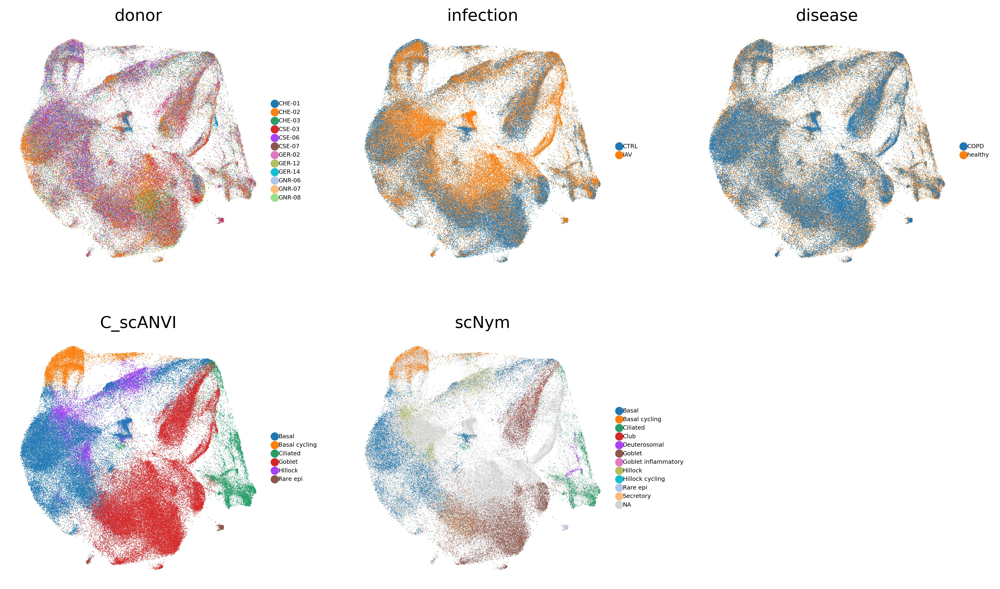

In [22]:
sc.pp.neighbors(adata, use_rep = "X_scANVI", n_neighbors = 50, metric = 'minkowski')
sc.tl.umap(adata, min_dist = 0.2, spread = 8, random_state = 1712)
sc.pl.umap(adata, frameon = False, color = ['donor', 'infection', 'disease', 'C_scANVI', 'scNym'], size = 1, legend_fontsize = 5, ncols = 3)